<a href="https://www.kaggle.com/code/uzeyirsacikay/determining-risky-locations-on-the-map?scriptVersionId=98841609" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

# Introduction

Hello! In this notebook we're going to explore the [California Traffic Collision Data from SWITRS](https://www.kaggle.com/alexgude/california-traffic-collision-data-from-switrs) and try to determine some high risk locations on the map based on the historical data. Here, high risk location refers to areas with high probability of crashes.

What makes this problem inherently difficult is that there is no canonical definition of a risky location and hence we don't have any labeled data. So, supervised approaches are off the table unless we somehow generate labeled data based on an insight. For now I will employ unsupervised techniques, mainly clustering methods to see what I get in the end. This is a simplistic first approach where we will restrict ourselves to work with only crash locations and dates. After gathering some insight, I am planning to incorporate rest of the data for a more holistic analysis. In particular, I am planning to try Deep Learning methods such as Self Organizing Maps (SOM), t-distributed stochastic neighbor embedding (t-SNE) which are usually catalogued under nonlinear dimensinoality reduction algorithms.

This database contains detailed information about every traffic collision reported to the California Highway Patrol between 2001 and 2021.

Note that this is my first trial on this sort of problem, so all feedbacks and suggestions are welcome!

# Exploratory Analysis

In [1]:
import sqlite3
import matplotlib.pyplot as plt
import os
import pandas as pd
import numpy as np
import datetime
import plotly.express as px
import plotly.graph_objects as go
from plotly.offline import iplot

pd.set_option('display.max_columns', 150)
pd.set_option('display.max_rows', 150)
pd.set_option('show_dimensions', True)

In [2]:
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/california-traffic-collision-data-from-switrs/switrs.sqlite


## Visualizing the collisions

Let's look at _when_ and _where_ collisions happen.

Below you can find two queries. The `collisions` table contains various information about the crashes and since it contains a huge number of records it is not possible to load all the columns for all crash entries with Kaggle's limit of 16GB RAM usage. Instead, we select all the columns for all the crashes that happened in the evening of 15 May 2021, specifically between 8PM and 9PM. This is the first query.

Regarding the second query: In this notebook we will only work with a small subset of the `collisions` table, the locations and the dates of the crashes in particular, so the second query is written for this purpose.

We apply both queries and save the results into pandas DataFrames:

In [3]:
# Read sqlite query results into a pandas DataFrame
with sqlite3.connect("/kaggle/input/california-traffic-collision-data-from-switrs/switrs.sqlite") as connection:
    
    query_collisions_all_columns = (
        "SELECT * "
        "FROM collisions "
        "WHERE collision_date == '2021-05-15' and collision_time LIKE '20:%' "
        "ORDER BY collision_time "
    )
    
    query_collisions = (
        "SELECT latitude, longitude, collision_date "
        "FROM collisions "
        "WHERE collision_date IS NOT NULL "
        "ORDER BY collision_date"
    )

    # Construct a Dataframe from the results
    # For now, we are only querying to get the collisions dataset
    
    df_collisions = pd.read_sql_query(query_collisions_all_columns, connection, parse_dates=["collision_date"])
    df = pd.read_sql_query(query_collisions, connection, parse_dates=["collision_date"])

Let us first explore all the columns:

In [4]:
df_collisions.head()

,case_id,jurisdiction,officer_id,reporting_district,chp_shift,population,county_city_location,county_location,special_condition,beat_type,chp_beat_type,city_division_lapd,chp_beat_class,beat_number,primary_road,secondary_road,distance,direction,intersection,weather_1,weather_2,state_highway_indicator,caltrans_county,caltrans_district,state_route,route_suffix,postmile_prefix,postmile,location_type,ramp_intersection,side_of_highway,tow_away,collision_severity,killed_victims,injured_victims,party_count,primary_collision_factor,pcf_violation_code,pcf_violation_category,pcf_violation,pcf_violation_subsection,hit_and_run,type_of_collision,motor_vehicle_involved_with,pedestrian_action,road_surface,road_condition_1,road_condition_2,lighting,control_device,chp_road_type,pedestrian_collision,bicycle_collision,motorcycle_collision,truck_collision,not_private_property,alcohol_involved,statewide_vehicle_type_at_fault,chp_vehicle_type_at_fault,severe_injury_count,other_visible_injury_count,complaint_of_pain_injury_count,pedestrian_killed_count,pedestrian_injured_count,bicyclist_killed_count,bicyclist_injured_count,motorcyclist_killed_count,motorcyclist_injured_count,primary_ramp,secondary_ramp,latitude,longitude,collision_date,collision_time,process_date
0,81477937,3014,1503,RD17,not chp,50000 to 100000,3014,orange,0,not chp,not chp,None,not chp,A2,GRANT ST,CANAL ST,20.0,north,0,clear,None,0,None,None,None,None,None,None,None,None,None,0,property damage only,0,0,3,vehicle code violation,None,unsafe starting or backing,22106.0,None,misdemeanor,other,parked motor vehicle,no pedestrian involved,dry,normal,None,dark with no street lights,none,0,0,0,0,0,1,NaN,passenger car,sport utility vehicle,0,0,0,0,0,0,0,0,0,None,None,NaN,NaN,2021-05-15,20:00:00,2021-05-20
1,81478651,1502,P93,None,not chp,100000 to 250000,1502,kern,0,not chp,not chp,None,not chp,Hill,REDLANDS DR,AUBURN ST,375.0,east,0,clear,None,0,None,None,None,None,None,None,None,None,None,1,property damage only,0,0,2,vehicle code violation,None,dui,23152.0,A,not hit and run,rear end,parked motor vehicle,no pedestrian involved,dry,normal,None,dark with street lights,none,0,0,0,0,0,1,1.0,pickup or panel truck,pickups & panels,0,0,0,0,0,0,0,0,0,None,None,35.40028,-118.95501,2021-05-15,20:04:00,2021-05-21
2,91478993,9345,021693,None,1400 thru 2159,100000 to 250000,0105,alameda,0,chp state highway,interstate,None,chp other,070,I-880 SOUTHBOUND,STEVENSON BOULEVARD,2112.0,north,0,cloudy,None,1,None,None,None,None,None,None,None,None,None,1,other injury,0,1,1,vehicle code violation,None,improper turning,22107.0,None,not hit and run,hit object,fixed object,no pedestrian involved,dry,normal,None,dusk or dawn,none,0,0,0,0,0,1,NaN,passenger car,"passenger car, station",0,1,0,0,0,0,0,0,0,None,None,37.52583,-121.99498,2021-05-15,20:05:00,2021-05-27
3,91483039,9530,022531,None,1400 thru 2159,unincorporated,1900,los angeles,0,chp county roadarea,county road area,None,chp other,002,EL SEGUNDO BLVD. (2300 BLOCK),WILLOWBROOK AVE.,70.0,west,0,clear,None,0,None,None,None,None,None,None,None,None,None,0,property damage only,0,0,2,vehicle code violation,None,unsafe lane change,21658.0,A,not hit and run,sideswipe,other motor vehicle,no pedestrian involved,dry,normal,None,dark with street lights,functioning,0,0,0,0,0,1,NaN,passenger car,sport utility vehicle,0,0,0,0,0,0,0,0,0,None,None,33.91617,-118.23233,2021-05-15,20:05:00,2021-05-27
4,9271289,1942,39177,0357,not chp,>250000,1942,los angeles,0,not chp,not chp,C,not chp,3A57,EXPOSITION BL,RAYMOND AV,0.0,None,1,cloudy,None,0,None,None,None,None,None,None,None,None,None,0,pain,0,1,2,vehicle code violation,None,speeding,22350.0,None,felony,rear end,other motor vehicle,no pedestrian involved,dry,normal,None,dark with street lights,functioning,0,0,0,0,0,1,NaN,None,unknown hit and run vehicle involvement,0,0,1,0,0,0,0,0,0,None,None,NaN,NaN,2021-05-15,20:05:00,2021-06-02


There are 75 columns! See [TIMS dictionary](https://tims.berkeley.edu/help/SWITRS.php#Crash_Level) for the descriptions. There are many interesting variables each depicting some aspect of the crash: The first 30 or so are about the specific location of the crash, the county it took place, the road it took place, where on the read, which direction etc. Although the table contains the latitude and longitude information too, these variables could be of use as well given the fact that GPS data may not always be accurate (We will see later that the ocean is full of road accidents!)

What seems to be of immense importance at first glance is the vehicle type, crash type and the variables depicting the severity of the accident: casualties, injuries etc. These could be really useful to differentiate between spots where there are a lot of crashes happen because it has a dense traffic pattern and the spots which host an unusual amount of dangerous accidents.

In [5]:
df

,latitude,longitude,collision_date
0,NaN,NaN,2001-01-01
1,NaN,NaN,2001-01-01
2,NaN,NaN,2001-01-01
3,NaN,NaN,2001-01-01
4,NaN,NaN,2001-01-01
...,...,...,...
9424329,37.08991,-121.65048,2021-06-02
9424330,39.82959,-121.93073,2021-06-02
9424331,39.19179,-121.00673,2021-06-02
9424332,34.16573,-118.48442,2021-06-03


There are nearly 9.5 million entries! We have collisions spanning a time range of January 2001 to June 2021 but as we can see some of the locations are missing, let's see what percent of the accidents don't have coordinate data:

In [6]:
int(((df.latitude.isnull() | df.longitude.isnull()).sum() / len(df)) * 100)

71

71% of the records do not have location data, below is graph of how much of the records of each year have location data:

In [7]:
df_percent_not_null = (df.groupby(df['collision_date'].dt.year).latitude.count() / df.groupby(df['collision_date'].dt.year).latitude.size() * 100).reset_index(name='Percentage').rename(columns={'collision_date': 'Year'})
fig = px.line(df_percent_not_null, x='Year', y='Percentage', title='Percentage of records with location data for each year')
fig.update_yaxes(range=[0, 100])
fig.show()

This is an interesting trend, for 2001-2007 almost none of the records have location data. From there on, the amount of records with location data increases steadily over the years. GPS became open to public first in 1983 during cold-war era, after a Korean commercial plane was shot down because it had entered into prohibited area, see [details](https://en.wikipedia.org/wiki/Global_Positioning_System#History:~:text=In%201983%2C%20after%20Soviet%20interceptor%20aircraft%20shot%20down%20the%20civilian%20airliner%20KAL%20007%20that%20strayed%20into%20prohibited%20airspace%20because%20of%20navigational%20errors%2C%20killing%20all%20269%C2%A0people%20on%20board%2C%20U.S.%20President%20Ronald%20Reagan%20announced%20that%20GPS%20would%20be%20made%20available%20for%20civilian%20uses%20once%20it%20was%20completed). It took 24 years for it become mainstream in cars. It was finally starting to be common in most cars, smartphones around 2007 as suggested by this [NPR article](https://www.npr.org/templates/story/story.php?storyId=17611103#:~:text=In%20fact%2C%202007%20was%20the,onto%20the%20arms%20of%20joggers.). This also explains the subsequent increase in records with location data after 2007.

Before getting rid off the records with no location, let us explore the number of crashes per month for each year. We plot all the records together with the records which contain GPS location of the collision:

In [8]:
counts = df.groupby(pd.Grouper(key='collision_date', freq='1M')).size().reset_index(name='All crashes').rename(columns={'collision_date': 'Month'})
counts_with_loc = df.groupby(pd.Grouper(key='collision_date', freq='1M')).latitude.count().reset_index(name='Crashes with location').rename(columns={'collision_date': 'Month'})
all_counts = pd.merge(counts, counts_with_loc, on='Month')
all_counts['Difference'] = (all_counts['All crashes'] - all_counts['Crashes with location'])

color_seq = px.colors.qualitative.Light24

fig = px.line(all_counts, x='Month', y=['All crashes', 'Crashes with location', 'Difference'], title='Crashes per month from January 2001 to May 2021')
fig['data'][2]['visible'] = 'legendonly'

for year in range(2001, 2021):
    fig.add_annotation(x=datetime.datetime(year, 7, 1), yref="paper", y=-0.05, 
                       align='center', text=str(year), showarrow=False)
    fig.add_vline(x=datetime.datetime(year+1, 1, 1),
                  line_dash="dash", opacity=0.5)

fig.update_layout(height=600,
                  xaxis_title='',
                  yaxis_title='Number of crashes',
                  xaxis_showticklabels=False,
                  paper_bgcolor="azure",
                  font=dict(size=15),
                  spikedistance=-1,
                  hovermode='x unified',
                  hoverlabel_namelength=-1,
                  xaxis=dict(showspikes = True,
                             spikemode='across',
                             showline=True,
                             showgrid=False,
                             linecolor="#BCCCDC",
                             spikethickness=2,
                             spikedash="dot",
                             spikecolor="#999999"),
                  legend = dict(title='', x=0.827, itemclick='toggle', itemdoubleclick='toggleothers', 
                                bgcolor="white", borderwidth=1 ,bordercolor="black"))

fig.update_traces(hovertemplate=None)

fig.update_yaxes(range=[0,57000])

annotation_dict = dict(font=dict(size=16, color="#ffffff"),
                       align="center", showarrow=True, arrowhead=2, 
                       bordercolor="#c7c7c7", borderwidth=2, borderpad=4,
                       bgcolor="#ff7f0e", opacity=1)

fig.add_annotation(x=datetime.datetime(2006, 8, 27), y=28300,
                   ax=-50, ay=50,
                   text="2006 Heat wave",
                   **annotation_dict)

fig.add_annotation(x=datetime.datetime(2008, 1, 15), y=41600,
                   ax=120, ay=-50,
                   text="Beginning of<br>The Great Recession",
                   **annotation_dict)

fig.add_annotation(x=datetime.datetime(2020, 4, 27), y=19900,
                   ax=-120, ay=80,
                   text="COVID-19 Pandemic<br>Lockdown",
                   **annotation_dict)

There are 2 major downspikes caused by the [2006 North American heat wave](https://en.wikipedia.org/wiki/2006_North_American_heat_wave#Deaths_in_California) and the COVID-19 Pandemic ([California was the first state to issue a stay at home order!](https://www.ksla.com/2020/03/20/california-becomes-first-state-order-lockdown/)). Then we have the long term drop from 2007 December to 2013 February caused by the [Great Recession](https://en.wikipedia.org/wiki/Great_Recession). For the yearly trends, see this [blog post](https://alexgude.com/blog/switrs-crashes-by-date/) by the host of this dataset for a more detailed breakdown of the trends.

As aforementioned, the location data starts to be available after 2007 which can be seen from the behaviour of records with location data. In the legend, there is a third trace named 'Difference'. It is toggled off by default, click on it to see how the difference between two numbers changes throughout the years. This is the inverted, wiggly version of the previous graph.

We need to discard the records without location and it is also reasonable to drop the records before 2010 even if they have location since there is a fairly low amount of records with location. Finally, we discard the month of June 2021, since it is incomplete, we have only 3 days of data from this month. So, we have:

In [9]:
df_location = df[(df['collision_date'].dt.year >= 2010) & 
                 (df['collision_date'] < datetime.datetime(2021,6,1)) & 
                 (df['latitude'].notna()) & 
                 (df['longitude'].notna())].reset_index(drop=True)
df_location

,latitude,longitude,collision_date
0,38.01125,-120.41051,2010-01-01
1,38.29109,-121.37109,2010-01-01
2,34.27227,-119.13772,2010-01-01
3,37.63875,-121.03047,2010-01-01
4,37.47102,-120.85573,2010-01-01
...,...,...,...
2504131,36.86130,-120.78171,2021-05-31
2504132,36.86236,-120.78249,2021-05-31
2504133,36.41120,-118.93770,2021-05-31
2504134,36.63906,-120.62465,2021-05-31


This leaves us with 2.5 million records even though we had nearly 9.5 millions records to begin with. The data we will work with spans a range from the beginning of January 2010 to the end of May 2021.

We seperate the `collision_date` column into three columns: year, month and day of the week to be able to group data easily:

In [10]:
df_location["year"] = df_location["collision_date"].dt.year
df_location["month"] = df_location["collision_date"].dt.month_name()
df_location["day"] = df["collision_date"].dt.day_name()
df_location = df_location.drop(columns='collision_date')
df_location

,latitude,longitude,year,month,day
0,38.01125,-120.41051,2010,January,Monday
1,38.29109,-121.37109,2010,January,Monday
2,34.27227,-119.13772,2010,January,Monday
3,37.63875,-121.03047,2010,January,Monday
4,37.47102,-120.85573,2010,January,Monday
...,...,...,...,...,...
2504131,36.86130,-120.78171,2021,May,Wednesday
2504132,36.86236,-120.78249,2021,May,Wednesday
2504133,36.41120,-118.93770,2021,May,Wednesday
2504134,36.63906,-120.62465,2021,May,Wednesday


Visualizing the crashes on the map: we focus on the year of 2019 as it would be too difficult to read if we were to map all the collisions. The [plotly](https://plotly.com/)'s interactive maps are perfect for such visualizations, specific regions can be zoomed in on for a closer look and the collisions for each month can be explored using the slider below the map.

In [11]:
def display_crashes(year):
    df_chosen_year = df_location.loc[df_location['year'] == year]
    length = len(df_chosen_year)

    fig = px.scatter_mapbox(df_chosen_year, 
                            lat = "latitude",
                            lon = "longitude",
                            mapbox_style = 'open-street-map',
                            opacity = 1,
                            color_discrete_sequence = ['#CD5C5C'],
                            zoom = 5,
                            animation_frame = "month",
                            size = np.ones(length),
                            size_max = 2,
                            center = {'lon': -119.4179, 'lat': 36.7783})

    fig.update_layout(autosize=True,
                      margin={"r":0,"t":50,"l":0,"b":0}, 
                      title = {'text': f"Crashes per month in {year} on the map", 'y': 0.98, 'font': dict(size=21)},
                      paper_bgcolor="azure")
    
    fig["layout"].pop("updatemenus") # optional, drop animation buttons
    fig["layout"]["sliders"][0]["pad"] = dict(l=0, r=150, b=20)

    return fig

# Pick a year between 2010 and 2020 to view its crashes on the map
display_crashes(2019)

## Geohashing

As we can see, even when we narrow the crashes down to a month they are way too homogenous and noisy to work with. We need to reduce the granularity of the data to be able to see things clearer but we need to retain most of the details while doing so. One nice way of doing this is to use [geohashes](https://en.wikipedia.org/wiki/Geohash)! Geohashing is a way of encoding location data into a string of characters, referred as location code. It works by dividing the map the into grids and each grid gets subdivided for finer detail:

<center><img src="https://i.imgur.com/4FzyA8C.jpg" style="display=block; margin:auto"/><\center>
<p style="text-align: center">
    <b>Figure 1.</b> Geohashing <br>
    <b>Source:</b> <a href="https://www.pubnub.com/learn/glossary/what-is-geohashing/">pubnub</a>
</p>

We can group collisions together if they happen to lie in the same grid to reduce clutters.

Location codes are obtained by stacking the names of each subgrid which contains our location, outer to inner. For example: in the first figure above, each grid consists of 4 quadrants, numbered 0-3 from left-to-right, top-to-bottom. Then, the bucket named 130 in the Level 3 means that are our location lies in the first quadrant of the Level 1, third quadrant of the Level 2 and zeroth quadrant of the Level 3. This way, we get a location code for each location with adjustable precision.

Our aim is to bucket together all the collisions that happen to fall in the same grid. This way, the noisy clutters will be tidied up a bit and the data will be easier to read.

We will use Google's [Open Location Code (OLC)](https://github.com/google/open-location-code) geocode system. The location codes created by OLC are referred as [plus codes](https://maps.google.com/pluscodes/). You can check out the grids [here](https://plus.codes/map) by toggling the Grid option which can be accessed from the stacked lines option list on the search bar. We begin by installing and importing the `openlocationcode` library:

In [12]:
!pip install openlocationcode

  Preparing metadata (setup.py) ... - done
  Created wheel for openlocationcode: filename=openlocationcode-1.0.1-py3-none-any.whl size=8419 sha256=ccf0e6ef68836a123301d7e8426ef2f99ddf25f69edc2c772e04c1879d4e3c3f
  Stored in directory: /root/.cache/pip/wheels/22/35/e2/e8522d642672138ffd5f7773236a5de74ceb22c99d78d9c866
Successfully built openlocationcode


As described in the documentation, we use `encode` to generate plus codes. Here we also give 8 as a parameter to create 8 character codes. This corresponds to roughly 300m x 300m square grids. The counterpart of `encode` is `decode`, it generates a CodeArea object which is basically a list of 3 coordinate pairs and a number to denote the code length. The coordinates are the South West corner, the North East corner and the center of the corresponding grid of the given plus code. See below for an example, we use the location of Swarmnect office at İTÜ Teknokent to generate a plus code and the draw the corresponding grid:

In [13]:
def draw_grid(code):
    coord = olc.decode(code)
    lat1, lon1 = coord.latitudeLo, coord.longitudeLo
    lat2, lon2 = coord.latitudeLo, coord.longitudeHi
    lat3, lon3 = coord.latitudeHi, coord.longitudeHi
    lat4, lon4 = coord.latitudeHi, coord.longitudeLo

    center_lat, center_lon = coord.latitudeCenter, coord.longitudeCenter

    fig = go.Figure(
        data=[go.Scattermapbox(mode = "lines",
                               fill = "toself",
                               name = "perimeter",
                               lon = [lon1, lon2, lon3, lon4, lon1],
                               lat = [lat1, lat2, lat3, lat4, lat1],
                               hoverinfo = "skip",
                               marker = {'size': 0}),
              go.Scattermapbox(mode = "text+markers",
                               name = "center",
                               text = f"Center of the grid<br>Plus code: {code}",
                               lon = [center_lon],
                               lat = [center_lat],
                               hoverinfo = "text+lat+lon",
                               marker = {'size': 8 ,'color': "purple" }),
              go.Scattermapbox(mode = "text+markers",
                               name = "south west",
                               text = f"South West corner of the grid",
                               lon = [lon1],
                               lat = [lat1],
                               hoverinfo = "text+lat+lon",
                               marker = {'size': 8 ,'color': "red" }),
              go.Scattermapbox(mode = "text+markers",
                               name = "north east",
                               text = f"North East corner of the grid",
                               lon = [lon3],
                               lat = [lat3],
                               hoverinfo = "text+lat+lon",
                               marker = {'size': 8 ,'color': "blue" }),
              go.Scattermapbox(mode = "text+markers",
                               name = "example_point",
                               text = f"Swarmnect office",
                               lon = [longitude_example],
                               lat = [latitude_example],
                               hoverinfo = "text+lat+lon",
                               marker = {'size': 8 ,'color': "orange"})]
    )

    fig.update_layout(
        title = {'text': f"An example of a grid - location matching", 'y': 0.98, 'font': dict(size=21)},
        mapbox = {
            'style': "open-street-map", 
            'center': {'lon': center_lon, 'lat': center_lat}, 
            'zoom': 15
        },
        showlegend = False,
        margin = {'l':0, 'r':0, 'b':0, 't':50})

    return fig

In [14]:
from openlocationcode import openlocationcode as olc

latitude_example = 41.107651
longitude_example = 29.032382
precision = 8
code = olc.encode(latitude_example, longitude_example, precision)
coord = olc.decode(code)
print("An example:")
print("-"*50)
print(f"The initial coordinates are {latitude_example}, {longitude_example}")
print(f"The plus code with {precision} characters is {code}")
print(f"The CodeArea object corresponding to these coordinates is: {coord}")
print(f"The center of the coordinates are {coord.latitudeCenter}, {coord.longitudeCenter}")
print(f"The coordinates of the North East corner are {coord.latitudeHi}, {coord.longitudeHi}")
print(f"The coordinates of the South West corner are {coord.latitudeLo}, {coord.longitudeLo}\n\n")
draw_grid(code)

An example:
--------------------------------------------------
The initial coordinates are 41.107651, 29.032382
The plus code with 8 characters is 8GHF425J+
The CodeArea object corresponding to these coordinates is: [41.1075, 29.03, 41.11, 29.0325, 41.10875, 29.03125, 8]
The center of the coordinates are 41.10875, 29.03125
The coordinates of the North East corner are 41.11, 29.0325
The coordinates of the South West corner are 41.1075, 29.03




The plan is to find the plus code of each collision and group the collisions with the same plus code together. Then, visualize the centers of the grids corresponding to those codes. This means that we first need to encode each coordinate pair, group based on the plus code, decode each code to get the grids. Starting with the encodings:

In [15]:
df_location['plus_code'] = df_location.apply(lambda row: olc.encode(row['latitude'], row['longitude'], 8), axis=1)
df_location.head(5)

,latitude,longitude,year,month,day,plus_code
0,38.01125,-120.41051,2010,January,Monday,84CX2H6Q+
1,38.29109,-121.37109,2010,January,Monday,84CW7JRH+
2,34.27227,-119.13772,2010,January,Monday,85627VC6+
3,37.63875,-121.03047,2010,January,Monday,849WJXQ9+
4,37.47102,-120.85573,2010,January,Monday,849XF4CV+


Grouping:

In [16]:
grid = df_location.groupby(by=['year', 'month', 'plus_code'], sort=False).size().reset_index(name='events')
grid.head(5)

,year,month,plus_code,events
0,2010,January,84CX2H6Q+,1
1,2010,January,84CW7JRH+,1
2,2010,January,85627VC6+,2
3,2010,January,849WJXQ9+,1
4,2010,January,849XF4CV+,1


We now have the number of collisions happened inside the 300 meters by 300 meters square grid corresponding to each code for each month of each year from January 2010 to May 2021. We continue with the decodings:

In [17]:
grid['decoded'] = grid['plus_code'].apply(lambda code: olc.decode(code))
grid.head(5)

,year,month,plus_code,events,decoded
0,2010,January,84CX2H6Q+,1,"[38.01, -120.4125, 38.0125, -120.41, 38.011250..."
1,2010,January,84CW7JRH+,1,"[38.29, -121.3725, 38.2925, -121.37, 38.29125,..."
2,2010,January,85627VC6+,2,"[34.27, -119.14, 34.2725, -119.1375, 34.27125,..."
3,2010,January,849WJXQ9+,1,"[37.6375, -121.0325, 37.64, -121.03, 37.63875,..."
4,2010,January,849XF4CV+,1,"[37.47, -120.8575, 37.4725, -120.855, 37.47125..."


Seperating the CodeArea object into the code length and coordinates of the corners and the center:

In [18]:
grid['latitude_center'] = grid['decoded'].apply(lambda dc: dc.latitudeCenter)
grid['longitude_center'] = grid['decoded'].apply(lambda dc: dc.longitudeCenter)
grid['latitude_lower_left'] = grid['decoded'].apply(lambda dc: dc.latitudeLo)
grid['longitude_lower_left'] = grid['decoded'].apply(lambda dc: dc.longitudeLo)
grid['latitude_upper_right'] = grid['decoded'].apply(lambda dc: dc.latitudeHi)
grid['longitude_upper_right'] = grid['decoded'].apply(lambda dc: dc.longitudeHi)
grid['precision'] = grid['decoded'].apply(lambda dc: dc.codeLength)
grid = grid.drop(columns='decoded')
grid.head(5)

,year,month,plus_code,events,latitude_center,longitude_center,latitude_lower_left,longitude_lower_left,latitude_upper_right,longitude_upper_right,precision
0,2010,January,84CX2H6Q+,1,38.01125,-120.41125,38.0100,-120.4125,38.0125,-120.4100,8
1,2010,January,84CW7JRH+,1,38.29125,-121.37125,38.2900,-121.3725,38.2925,-121.3700,8
2,2010,January,85627VC6+,2,34.27125,-119.13875,34.2700,-119.1400,34.2725,-119.1375,8
3,2010,January,849WJXQ9+,1,37.63875,-121.03125,37.6375,-121.0325,37.6400,-121.0300,8
4,2010,January,849XF4CV+,1,37.47125,-120.85625,37.4700,-120.8575,37.4725,-120.8550,8


Let us now display the grids to see our map coverage. We have an exhaustingly high number of grids and it is costly to display them all at once. We will stick with a random sample from all grids to get an idea:

In [19]:
total_grids = len(grid['plus_code'].unique())
percentage = 10
sample_size = int(total_grids * percentage/100)

print(f"There is a total of {total_grids:,} grids and we will display ~{percentage}% of all the grids which is {sample_size:,}")

There is a total of 355,159 grids and we will display ~10% of all the grids which is 35,515


In [20]:
to_be_displayed = grid.drop_duplicates(subset=['plus_code']).sample(sample_size).reset_index(drop=True).drop(['year', 'month', 'events'], axis=1)

from itertools import chain

lat1, lon1 = to_be_displayed['latitude_lower_left'].tolist(), to_be_displayed['longitude_lower_left'].tolist()
lat2, lon2 = to_be_displayed['latitude_lower_left'].tolist(), to_be_displayed['longitude_upper_right'].tolist()
lat3, lon3 = to_be_displayed['latitude_upper_right'].tolist(), to_be_displayed['longitude_upper_right'].tolist()
lat4, lon4 = to_be_displayed['latitude_upper_right'].tolist(), to_be_displayed['longitude_lower_left'].tolist()
center_lat, center_lon = to_be_displayed['latitude_center'].tolist(), to_be_displayed['longitude_center'].tolist()
plus_codes = [ [f"Plus code: {code}"] + 7 * [None] for code in to_be_displayed['plus_code'].tolist()]
none = [None] * sample_size

longitudes = zip(center_lon, none, lon1, lon2, lon3, lon4, lon1, none)
latitudes = zip(center_lat, none, lat1, lat2, lat3, lat4, lat1, none)

longitudes = list(chain.from_iterable(longitudes))
latitudes = list(chain.from_iterable(latitudes))
plus_codes = list(chain.from_iterable(plus_codes))

In [21]:
import plotly.graph_objects as go

fig = go.Figure(go.Scattermapbox(
    mode = "lines+markers",
    fill = "toself",
    text = plus_codes,
    lon = longitudes,
    lat = latitudes,
    hoverinfo = (["text+lat+lon"] + ["skip"] * 7) * sample_size,
    selectedpoints = list(range(0, 8 * sample_size, 8)),
    selected_marker = {'size': 2 ,'color': "purple" },
    unselected_marker = {'size': 0}
))

fig.update_layout(
    mapbox = {
        'style': "open-street-map", 
        'center': {'lon': -119.4179, 'lat': 36.7783},
        'zoom': 5
    },
    showlegend = False,
    title = f"A sample of ~{percentage}% of all the grids where total grids is {total_grids:,} and the sample size is {sample_size:,}",
    margin = {'l':0, 'r':0, 'b':0, 't':50},
    paper_bgcolor="azure",
    autosize=True
)

fig.show()

Note that the sample is chosen from all the grids of all the years. It might look messy but fortunately, checking the distribution of average number of collisions of grids over the months, we see that the half of the grids has only had a single collision in 10 years!

In [22]:
dist = grid.groupby(['plus_code'])['events'].sum().value_counts().sort_index()
dist = dist.to_frame(name='Number of grids').rename_axis('Total number of collisions').reset_index()
dist['Percentage'] = (dist['Number of grids'] / dist['Number of grids'].sum() * 100).round(decimals=1)

fig = px.bar(dist[:30], x='Total number of collisions', y='Number of grids', text='Percentage')
fig.update_traces(texttemplate='%{text:.2s}%', textposition='outside')
fig.update_layout(title='Distribution of total number of collisions between the grids in 10 years',
                  xaxis_title='Total number of collisions in 2010-2020',
                  yaxis_title='Number of grids',
                  xaxis_nticks=31,
                  yaxis_range=[0,190000],
                  uniformtext_minsize=10,
                  uniformtext_mode='hide',
                  font=dict(size=15),
                  paper_bgcolor="antiquewhite")

fig.show()

So, let us see the grids with more than 5 crashes for each month from 2016 to 2020:

In [23]:
cutoff = 5
min_year = 2016
max_year = 2019

disp = grid.loc[(grid['events'] > cutoff) & (grid['year'] >= min_year) & (grid['year'] <= max_year)].copy()

disp['Year/Month'] = disp['year'].astype(str) + " " + disp['month']

fig = px.scatter_mapbox(disp, 
                        lat = "latitude_center",
                        lon = "longitude_center",
                        mapbox_style = 'open-street-map',
                        color = "events",
                        color_discrete_sequence=px.colors.qualitative.Alphabet,
                        range_color = [disp['events'].min(), disp['events'].max()],
                        opacity = 0.5,
                        size = 'events',
                        size_max = 30,
                        zoom = 5,
                        hover_name = "plus_code",
                        animation_frame = "Year/Month",
                        title = f"Map of collisions in California between {min_year} - {max_year+1}"
                       )

fig.update_layout(autosize=True, margin={"r":0,"t":45,"l":0,"b":0}, paper_bgcolor="azure", font=dict(size=15))

fig["layout"].pop("updatemenus") # optional, drop animation buttons
fig['layout']['sliders'][0]['pad'] = dict(l=0, r=150, b=20)

fig.show()

# Clustering

One way of determining the spots where accidents accumulate is clustering. Clustering is also the most common unsupervised learning approach. We will try two different clustering algorithms: K-means and DBSCAN. K-means is built to be used with Euclidean metric whereas DBSCAN can work with an arbitrary metric such as haversine which is specifically used for latitudes and longitudes. We think that the DBSCAN will perform better both because of the haversine metric and the way it works: K-means works on a global level when choosing the centroids and constructing the clusters but DBSCAN works by building the clusters bottom-up. We begin with the K-means.

## K-means

K-means is a simple unsupervised learning algorithm used to cluster the data into groups based on similarity. The measure of similarity here is defined as a distance between the data points, more spefically the Euclidean distance between the vectors defined by each row.

The algorithm begins by choosing K centroids which denote the centers of the clusters. This initial choice can be purely random but there are more optimized initialization techniques (see [k-means++](https://en.wikipedia.org/wiki/K-means%2B%2B)). Then, each vector is assigned to the closest centroid's cluster. After all the vectors are assigned, we have K clusters but this is probably not the most reasonable way of choosing clusters. In order to improve clusters, for each cluster, the centroid is recalculated as the mean of the vectors in cluster. Once the centroids are updated, the closest centroid for some of the vectors have changed. So, each vector gets reassigned and the same process is continued until no vector changes it's cluster. The algorithm can be summarized as:
<br/><br/>
<center><img src="https://developer.ibm.com/developer/default/articles/cc-unsupervised-learning-data-classification/images/figure04.png" style="display=block; margin:auto"/><\center>
<p style="text-align: center">
    <b>Figure 2.</b> K-means <br>
    <b>Source:</b> <a href="https://developer.ibm.com/articles/cc-unsupervised-learning-data-classification/">IBM</a>
</p>

One important thing to note is that the number of clusters is an hyperparameter, i.e., it needs to be provided externally. To determine the optimal number of clusters, we will use what is called the elbow method: We will run K-means for a range of K values and for each K, we will plot the sum of squared distances (SSE) between each point and it's assigned centroid. As K increases, SSE drops naturally. It converges to zero in the extreme case of each point being its own cluster. So, we get an elbow shaped curve at the end. We wish to locate a knee point in this curve which occurs when increasing K is no longer worth the corresponding drop in SSE. This can be done without relying on the visual inspection by using the Kneedle algorithm but for our purposes, visual inspection is sufficient.

We also need to incorporate the number of events in each grid. We do so by supplying the K-means with weights where weights are the `events` column in our case. This way, when taking the average to find the centroid the weighted average is used. This way, the grids with high number of collisions pulls the centroid towards themselves.

We will use scikit-learn's [KMeans](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html) to cluster the grids with the number of collisions greater than 5. Down below are the elbow curves of each year. For simplicity, we focus on the years 2016 to 2019.

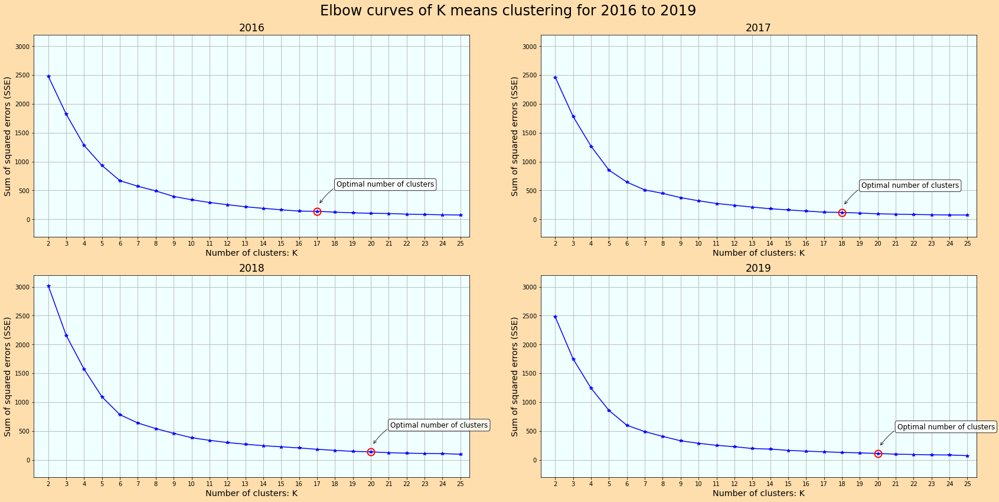

In [24]:
from sklearn.cluster import KMeans

def elbow_curves(df_grouped, upper_limit=20, optimal_k={}):
    fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(24, 12), facecolor='navajowhite')
    plt.suptitle('Elbow curves of K means clustering for 2016 to 2019', fontsize=24)
    axs = axs.ravel()
    i=0
    for group_name, group in df_grouped:
        features = group[['latitude_center', 'longitude_center']].values
        weights = group['events'].values
        distortions = []
        
        K = range(1, upper_limit+1) 
        for k in K:
            kmeans = KMeans(n_clusters=k)
            kmeans.fit(features, sample_weight = weights)
            distortions.append(kmeans.inertia_)

        # plot elbow curve
        axs[i].plot(K[1:], distortions[1:], 'b*-')
        if optimal_k:
            kIdx = optimal_k[group_name]
            axs[i].plot(K[kIdx-1], distortions[kIdx-1], marker='o', markersize=12,
                  markeredgewidth=2, markeredgecolor='r', markerfacecolor='None')
            axs[i].annotate("Optimal number of clusters", xy=(K[kIdx-1]+0.1, distortions[kIdx-1]+120),  xycoords='data',
                        bbox=dict(boxstyle='round', color='k', fc='w', alpha=0.8),
                        xytext=(30, 30), textcoords='offset points', ha='left',
                        arrowprops=dict(arrowstyle='->', connectionstyle='arc3,rad=0.4', color='k', alpha=0.8),
                        size='large')
        axs[i].grid(True)
        axs[i].set_facecolor('azure')
        axs[i].set_xticks(range(0, upper_limit+1, 1))
        axs[i].set_xlim(1.2, upper_limit+0.5)
        axs[i].set_ylim(-300, 3200)
        axs[i].set_xlabel('Number of clusters: K', fontsize='x-large')
        axs[i].set_ylabel('Sum of squared errors (SSE)', fontsize='x-large')
        axs[i].set_title(group_name, fontsize='xx-large')
        i += 1
        
    fig.tight_layout()
    plt.subplots_adjust(top=0.92)
    plt.show()
    
grouped = disp.groupby(['year', 'plus_code', 'latitude_center', 'longitude_center'])['events'].sum().reset_index().groupby('year')
optimal_k={2016: 17, 2017: 18, 2018: 20, 2019: 20}
elbow_curves(grouped, upper_limit=25, optimal_k=optimal_k)

Having determined the number of clusters, let us now find the cluster of each record:

In [25]:
from sklearn.cluster import KMeans

def km_cluster(group, group_name):
    features = group[['latitude_center', 'longitude_center']].values
    weights = group['events'].values
    km = KMeans(optimal_k[group_name], init='k-means++') # initialize
    km.fit(features)
    c = km.predict(features)
    group['label'] = c+1
    group.sort_values(['label'], ignore_index=True, inplace=True)
    return group

km_clusters = grouped.apply(lambda g: km_cluster(g, g.name)).reset_index(drop=True)
km_clusters

,year,plus_code,latitude_center,longitude_center,events,label
0,2016,8553VPF8+,33.87375,-118.28375,6,1
1,2016,85635J3W+,34.15375,-118.35375,6,1
2,2016,85635J3V+,34.15375,-118.35625,6,1
3,2016,85634Q22+,34.10125,-118.24875,12,1
4,2016,85634PRC+,34.14125,-118.27875,14,1
...,...,...,...,...,...,...
2721,2019,85635C96+,34.16875,-118.58875,6,20
2722,2019,856359CV+,34.17125,-118.60625,7,20
2723,2019,85634GXJ+,34.14875,-118.46875,25,20
2724,2019,8563H83H+,34.55375,-118.67125,6,20


We are now ready to plot the results on a map. I thought it would be helpful to plot the convex hull of each cluster as well and had this thoery that none of the convex hulls would intersect. Let's see if this is the case. Firstly, we have a few helper functions for mapping:

In [26]:
from scipy.spatial import ConvexHull, convex_hull_plot_2d
# finds the convex hull of a given set of points
def cluster_convex_hull(points):
    hull = ConvexHull(points)
    ch_lon = np.append(points[hull.vertices,1], points[hull.vertices[0],1])
    ch_lat = np.append(points[hull.vertices,0], points[hull.vertices[0],0])
    return ch_lon, ch_lat

# given a color in hex code format, maps it to its half transparent
# version by mapping it to its rgba code with 0.5 opacity
def hex_to_rgba(hex_string, opacity = 0.5):
    h = hex_string.lstrip('#')
    return "rgba" + str(tuple(int(h[i:i+2], 16) for i in (0, 2, 4)) + (opacity,))

# returns the ordinal suffix of a given number: 1 --> "st", 2 --> "nd", 7 --> "th"
def ord(n):
    return str(n)+("th" if 4<=n%100<=20 else {1:"st",2:"nd",3:"rd"}.get(n%10, "th"))

In [27]:
# dictionary of the number of points in each year
N = {year: len(km_clusters.loc[km_clusters['year']==year]) for year in range(2016, 2020)}

# hover text to be shown
Text = { year: ['Plus code: ']*N[year] + km_clusters.loc[km_clusters['year']==year]['plus_code'] + \
['<br>Label: ']*N[year] + km_clusters.loc[km_clusters['year']==year]['label'].apply(lambda x: str(x)) + \
['<br>Events: ']*N[year] + km_clusters.loc[km_clusters['year']==year]['events'].apply(lambda x: str(x)) + \
['<br>Year: ']*N[year] + [str(year)]*N[year] for year in range(2016, 2020)}

km_clusters['color'] = km_clusters['label'].apply(lambda l: hex_to_rgba(px.colors.qualitative.Dark24[l-1], opacity=0.8))

#####################################  FRAMES  #####################################

frames = []

for year in range(2016, 2020): 
    data = [go.Scattermapbox(name = "Events",
                             mode = "markers",
                             lat = km_clusters.loc[km_clusters['year']==year]['latitude_center'],
                             lon = km_clusters.loc[km_clusters['year']==year]['longitude_center'],
                             text = Text[year],
                             marker_color = km_clusters.loc[km_clusters['year']==year]['color'],
                             hoverinfo = "text+lat+lon")]
    for k in range(1, optimal_k[year]+1):
        kth_cluster = km_clusters.loc[(km_clusters['year'] == year) & (km_clusters['label']==k)][['latitude_center', 'longitude_center']].values
        if(len(kth_cluster) < 3):
            ch_longitudes, ch_latitudes = kth_cluster[:,1], kth_cluster[:,0]
        else:
            ch_longitudes, ch_latitudes = cluster_convex_hull(kth_cluster)
        data.append(go.Scattermapbox(name = f"{ord(k)} cluster",
                                     mode = "lines",
                                     fill = "toself",
                                     lon = ch_longitudes,
                                     lat = ch_latitudes,
                                     fillcolor = hex_to_rgba(px.colors.qualitative.Dark24[k-1], opacity=0.1),
                                     line=dict(width=2, color=hex_to_rgba(px.colors.qualitative.Dark24[k-1], opacity=0.5)),
                                    ))
    for k in range(max(optimal_k.values()) - optimal_k[year]):
        data.append(go.Scattermapbox(lat = [None], lon = [None]))
    frames.append(go.Frame(name=str(year), data=data))
    
#####################################  SLIDERS  #####################################
    
sliders_dict = {"active": 0, "len": 0.9, "steps": [], "x": 0.1, "xanchor": "left",
                "currentvalue": {"font": {"size": 20}, "prefix": "Year:", "visible": False},
                "pad": {"b": 10, "t": 50, "r":100}, "y": 0, "yanchor": "top"}

for year in range(2016, 2020):
    slider_step = {"args": [[str(year)], {"frame": {"duration": 0, "redraw":True}, 
                             "mode": "immediate", "fromcurrent": True,
                             "transition": {"duration": 0, "easing": "elastic"}}],
                   "label": str(year) + f"<br>Number of clusters: {optimal_k[year]}",
                   "method": "animate"}
    sliders_dict["steps"].append(slider_step)
    
#####################################  TRACES AND LAYOUTS  #####################################

data = [go.Scattermapbox(name = "Grids",
                         mode = "markers",
                         lat = km_clusters.loc[km_clusters['year']==2016]['latitude_center'],
                         lon = km_clusters.loc[km_clusters['year']==2016]['longitude_center'],
                         text = Text[2016],
                         marker_color = km_clusters.loc[km_clusters['year']==2016]['color'],
                         hoverinfo = "text+lat+lon")]

for k in range(1, optimal_k[2016]+1):
        kth_cluster = km_clusters.loc[(km_clusters['year'] == 2016) & (km_clusters['label']==k)][['latitude_center', 'longitude_center']].values
        if(len(kth_cluster) < 3):
            ch_longitudes, ch_latitudes = kth_cluster[:,1], kth_cluster[:,0]
        else:
            ch_longitudes, ch_latitudes = cluster_convex_hull(kth_cluster)
        data.append(go.Scattermapbox(name = f"{ord(k)} cluster",
                                     mode = "lines",
                                     fill = "toself",
                                     lon = ch_longitudes,
                                     lat = ch_latitudes,
                                     fillcolor = hex_to_rgba(px.colors.qualitative.Dark24[k-1], opacity=0.3),
                                     line=dict(width=2, color=hex_to_rgba(px.colors.qualitative.Dark24[k-1], opacity=0.8))))

for k in range(max(optimal_k.values()) - optimal_k[2016]):
    data.append(go.Scattermapbox(lat = [None], lon = [None]))

layout = go.Layout(mapbox = {'style': "carto-positron", 
                                           'center': {'lon': -119.4179, 'lat': 36.7783},
                                           'zoom': 5},
                   title = f"K-means clusters with convex hulls",
                   font = dict(size=15),
                   margin = {'l':0, 'r':0, 'b':0, 't':50},
                   paper_bgcolor="azure",
                   autosize=True,
                   sliders=[sliders_dict],
                   legend = dict(itemclick='toggle',
                                 itemdoubleclick='toggleothers',
                                 x=1.005,
                                 y=1,
                                 bgcolor="White")
                  )

fig = go.Figure(data=data, layout=layout, frames=frames)
fig.show()

The convex hulls of different cluster does not intersect! It intuitively makes sense that they would not intersect, otherwise the points lying inside the intersection would have to be reassigned to either one of the cluster which cannot be the case since the algorithm would not have stopped in that case. To see the points only, double click on the 'Grids' in the legend to toggle off all the convex hulls.

The convex hulls aside, there isn't much of a valuable information in the clusters above. As noted earlier, the K-means works on a global level so the results are not surprising. Let us now move try clustering with DBSCAN and see what we get.

## Density-based spatial clustering of applications with noise (DBSCAN)

DBSCAN works quite differently compared to K-means, it packs the points in high-density regions together and marks the points in low-density regions as noise. It works based on two parameters, the maximum distance between two points to be considered as neighbors (epsilon) and a minimum number of neighbors (including the point itself) for a point to be considered as a core point (min_samples). The algorithm begins by determining for eachpoint, whether it is a core point or not.Then a core point is picked at random and all the points that are reachable from that core point is set to be a cluster. The process is repeated until no core point remains without a cluster. The remaining points without a cluster are considered to be the noise. We have an example in the figure below: the minimum number of neighbors threshold to be considered as a core point is 4 and the maximum distance is shown via the circles around the points. The core points are colored red since they all have at least 4 neighbors. Then, A is chosen as the starting point and since all the red and yellow points are reachable from A, they are clustered together. The remaining point, N, is the noise.
</br></br>
<center>
    <img src="https://upload.wikimedia.org/wikipedia/commons/thumb/a/af/DBSCAN-Illustration.svg/320px-DBSCAN-Illustration.svg.png" style="display=block; margin:auto"/>
</center>
<p style="text-align: center">
    <b>Figure 3.</b> DBSCAN <br>
    <b>Source:</b> <a href="https://en.wikipedia.org/wiki/DBSCAN">Wikipedia</a>
</p>

The main takeaway is that it works on a local level and therefore is much more suited for our purposes. We use scikit-learn's [DBSCAN](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.DBSCAN.html). We set the epsilon as 1km and the min_samples as 50. This time in order to account for the number of collisions inside the grids, we select the upper half of all the clusters of each year based on the total number of collisions in that cluster. We again focus on the years from 2016 to 2019.

In [28]:
from sklearn.cluster import DBSCAN

def DBSCAN_cluster(group, eps_km, min_sample):
    features = group[['latitude_center', 'longitude_center']].values
    weights = group['events'].values
    kms_per_radian = 6371.0088
    epsilon = eps_km / kms_per_radian
    db = DBSCAN(eps=epsilon, min_samples=min_sample, algorithm='ball_tree', metric='haversine').fit(np.radians(features), sample_weight=weights)
    cluster_labels = db.labels_
    num_clusters = len(set(cluster_labels))
    group['label'] = cluster_labels+1
    group.sort_values(['label'], ignore_index=True, inplace=True)
    return group

def filter_clusters(df_grouped, eps_km, min_sample, threshold_percentile=0.5):
    # finding the clusters
    dbscan_clusters = df_grouped.apply(lambda g: DBSCAN_cluster(g, eps_km, min_sample)).reset_index(drop=True)
    
    # finding the within cluster sum of events
    cluster_sums = dbscan_clusters.groupby(['year', 'label'], sort=False)['events'].sum().reset_index()
    # setting the thresholds for each year
    thresholds = cluster_sums.loc[(cluster_sums['label'] != 0)].groupby('year')['events'].quantile(threshold_percentile)
    #filtering based on thresholds
    filtered = cluster_sums.groupby(['year', 'label']).filter(lambda gr:  gr.events > thresholds[gr.name[0]]).drop('events', axis=1)
    filtered = filtered.merge(dbscan_clusters, on = ['year', 'label']).sort_values(['year', 'label'])
    # remapping the labels to avoid gaps in their numbering
    remap = dict()
    filter_groups = filtered.groupby('year')
    for group_name, group in filter_groups:
        remap_val = dict()
        for i, label in enumerate(group.label.unique()):
            remap_val[label] = str(i) if i else "Noise"
        remap[group_name] = remap_val
    filtered.label = filtered.groupby('year')['label'].apply(lambda g: g.map(remap[g.name]))
    
    return filtered

dbsc = filter_clusters(grouped, 1, 50, threshold_percentile=0.5)
dbsc

,year,label,plus_code,latitude_center,longitude_center,events
0,2016,Noise,846XFQCP+,34.47125,-120.21375,7
1,2016,Noise,85632R5R+,34.00875,-118.15875,6
2,2016,Noise,85632P89+,34.01625,-118.28125,6
3,2016,Noise,85632P39+,34.00375,-118.28125,6
4,2016,Noise,85632P29+,34.00125,-118.28125,9
...,...,...,...,...,...,...
2451,2019,14,8564357M+,34.06375,-117.81625,15
2452,2019,14,8564357P+,34.06375,-117.81375,36
2453,2019,14,8564357J+,34.06375,-117.81875,27
2454,2019,14,8564357H+,34.06375,-117.82125,6


Plotting the clusters on the map:

In [29]:
fig = px.scatter_mapbox(dbsc, 
                        lat = "latitude_center",
                        lon = "longitude_center",
                        mapbox_style = 'carto-positron',
                        color = 'label',
                        color_discrete_sequence=px.colors.qualitative.Dark24,
                        opacity = 0.5,
                        size_max = 5,
                        zoom = 5,
                        hover_name = "plus_code",
                        title = f"DBSCAN clusters",
                        height = 600,
                        center = {'lon': -119.4179, 'lat': 36.7783}, 
                        animation_frame = "year")

fig.update_layout(margin={"r":0,"t":45,"l":0,"b":0}, paper_bgcolor="azure", font=dict(size=15), 
                  legend = dict(x=1.01, itemclick='toggle', itemdoubleclick='toggleothers', bgcolor="white"))

fig["layout"].pop("updatemenus") # optional, drop animation buttons
fig['layout']['sliders'][0]['pad'] = dict(l=0, r=150, b=20)
fig['layout']['sliders'][0]['currentvalue']['visible'] = False
for year in range(2016, 2020):
    fig['layout']['sliders'][0]['steps'][0]['label'] = str(year) + f"<br>Number of clusters: {dbsc.loc[dbsc['year']==year].label.nunique()}"
    
fig['data'][0]['visible'] = 'legendonly'
fig.show()

This is a much cleaner result! The risky locations can be seen easily on the map. The noise is toggled off by default, it can be toggled on by clicking on it.

## Conclusion

This is an introductory work on risk mapping. We have only worked with crash locations as time series data. Although the approach is simplistic, we got some fruitful results in the end via DBSCAN. There are many other fields which could be of immense use for assessing the risk level of different areas of interest. In the future I am planning to incorporate more features for a more holistic analysis.